# CS498PS - Lab 3: Artificial Reverberation and Room Simulation


In this lab we will get some experience in simulating rooms digitally. We will design some simple reverbs using small filters and then work towards a more principled room simulator. You can use whichever sound you like for the following examples, usually a sound with sharp onsets is good for such experiments. One good example is the drum loop [ https://drive.google.com/uc?export=download&id=16mqI3xFN00AK5bP5k1VYJiEfH7ghHHSf ]

## Part 1. Designing simple reverb using filters

The simplest forms of reverbs can be designed using simple delays, comb and allpass filters. We will design one of each to get started.

a) A room with a single wall. For this reverb we will assume that we have a room that only has one reflective wall as shown below. Design a filter that simulates what the microphone will record. figure out the right filter in the case where $d_i = [0.1, 1]$ meters, and in the case where $d_i = [1, 10]$ meters. Let me know what the differences between these sounds are. To keep things simple, round the delays to an integer number and make up an approximate gain loss due to propagation and the wall bounce.

<img src="https://drive.google.com/uc?export=download&id=1uaSmnwcXAtN29RtWQymUfmw2i-AuTl_g" title="Room for part 1.a" width=200 >

In [42]:
import scipy.signal as sg
import matplotlib.pyplot as pp
import numpy as np
import IPython
import scipy.io.wavfile as wavfile
import math
import matplotlib
from matplotlib import mlab as mlab

pp.rcParams["figure.figsize"] = (10, 6)

[94 59  2 ... -4  2  0]


Drum loop


"delay A, 0.1 - 1"


"delay A, 1 - 10"


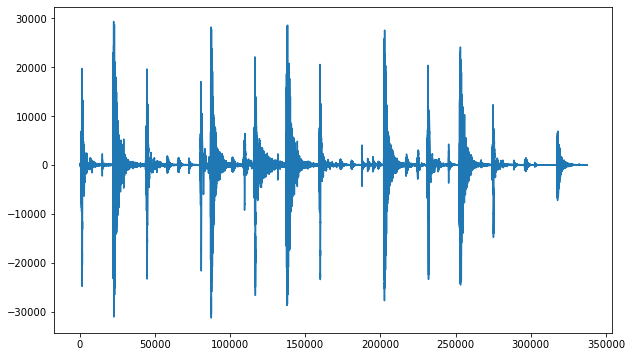

In terms of audio, the difference between (0.1,1) and (1,10) is that the in the second example,
the echo is more clear than the first, due to the longer distance.
Looking at the graphs, we see that both distances will reduce the amplitude of the original, but that the second one will
be more elongated than the first.


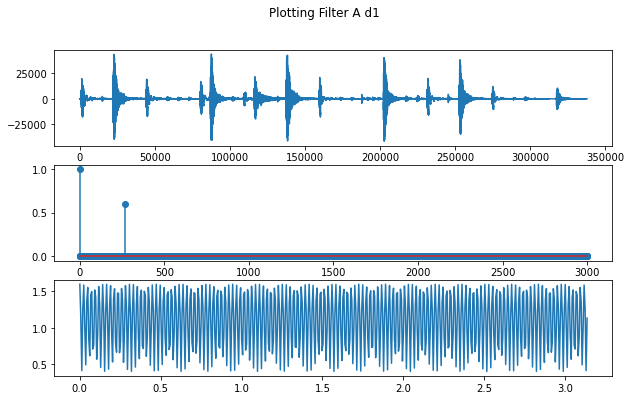

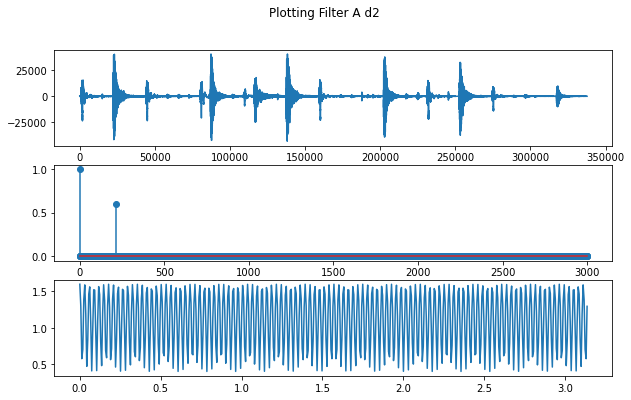

In [113]:
# YOUR CODE HERE
speedOfSound = 343 #meters per second
g = 0.6
def sound( x, rate=8000, label=''):
    from IPython.display import display, Audio, HTML
    display( HTML( 
    '<style> table, th, td {border: 0px; }</style> <table><tr><td>' + label + 
    '</td><td>' + Audio( x, rate=rate)._repr_html_()[3:] + '</td></tr></table>'
    ))

def soloFilter(sound, rate, d1,d2):
    directDelay = d1/speedOfSound
    bounceDistance = 2 * (d1**2 + d2 **2) ** 0.05
    bounceDelay = bounceDistance/speedOfSound - directDelay
    N = int(bounceDelay*rate) #get N length
    x = np.append(sound, [0] * N)  #populate with sound, zeros
    a = [1]
    b = [1] + [0] *(N-1)+[g] # b = [1, 0 ,0 ... , g]  |b| = N
    return sg.lfilter(b, a, x), b, a, x

def plotFilter(result, b, a, x, label):
    xSample = [1] + 3000 * [0]
    fig, (sound, impulse, freq) = pp.subplots(3)
    fig.suptitle(label)
    sound.plot(result)
    impulse.stem(sg.lfilter(b, a, xSample), use_line_collection=True)
    comb_w, comb_h = sg.freqz(b,a)
    freq.plot(comb_w, np.abs(comb_h))
    
rate, file = wavfile.read('loop.wav')
print(file)
sound(file,rate, label='Drum loop')
resultsA1, bA1, aA1, xA1 = soloFilter(file, rate, 0.1,1)
sound(resultsA1,rate, label='delay A, 0.1 - 1')
resultsA2, bA2, aA2, xA2 = soloFilter(file, rate, 1,10)
sound(resultsA2,rate, label='delay A, 1 - 10')


pp.plot(file)
pp.show()
plotFilter(resultsA1, bA1, aA1, xA1, "Plotting Filter A d1")
plotFilter(resultsA2, bA2, aA2, xA2, "Plotting Filter A d2")
print("In terms of audio, the difference between (0.1,1) and (1,10) is that the in the second example,\n"+
      "the echo is more clear than the first, due to the longer distance.\n"+
     "Looking at the graphs, we see that both distances will reduce the amplitude of the original, but that the second one will\n"+
     "be more elongated than the first.")

b) Now we will use a room geometry as shown below. Design the proper filter again, for $d_i = [0.1, 1]$ meters and then for $d_i = [1, 10]$ meters. Comment on the audible differences between these two settings.

<img src="https://drive.google.com/uc?export=download&id=1uYqG6VqhPegoxuJwvJCqm0zY7Ced-3Ih" title="Room for part 1.b" width=200 >

Drum loop


"delay B, 0.1 - 1"


"delay B, 1 - 10"


In terms of audio differences between the two distances, we see that with a larger distance, we get more reverberation,
as the early reflections are more noticeable. It's also important to note that the sound is different because of 
how the comb filter colors the sound, creating peaks, as seen in my graphs


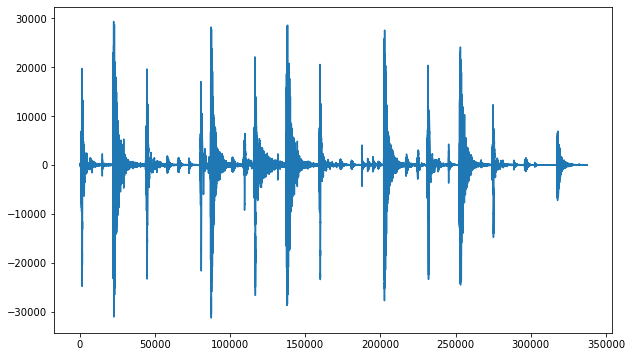

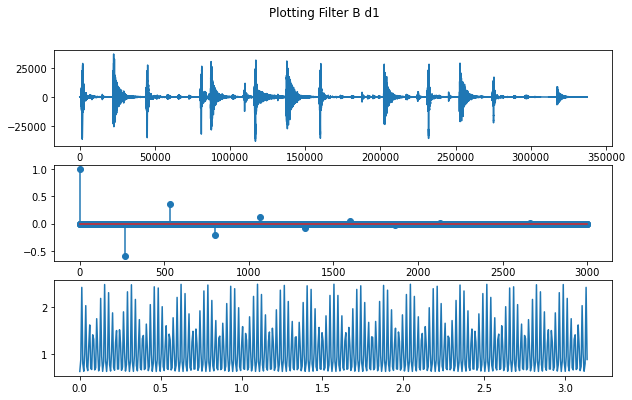

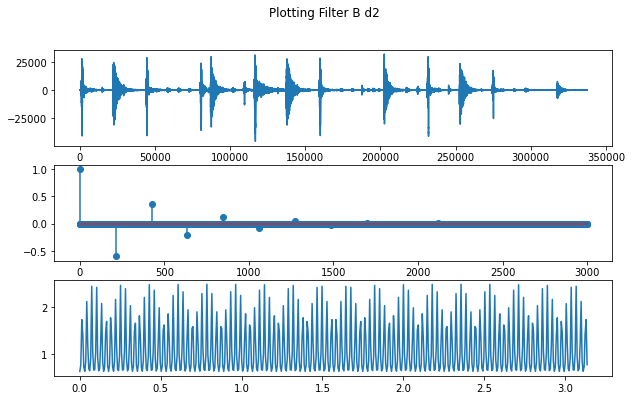

In [114]:
# YOUR CODE HERE
def combFilter(sound,rate, d1,d2):
    directDelay = d1/speedOfSound
    bounceDistance = 2 * (d1**2 + d2 **2) ** 0.05
    bounceDelay = bounceDistance/speedOfSound - directDelay
    N = int(bounceDelay*rate) #get N length
    x = sound   #populate with sound, no zeros
    a = [1] + [0] * (N-1) + [g]  # a = [1, 0 ,0 ... , g]  |b| = N
    b = [1]
    return sg.lfilter(b, a, x), b, a, x

sound(file,rate, label='Drum loop')
resultsB1, bB1, aB1, xB1 = combFilter(file, rate, 0.1,1)
sound(resultsB1,rate, label='delay B, 0.1 - 1')
resultsB2, bB2, aB2, xB2 = combFilter(file, rate, 1,10)
sound(resultsB2,rate, label='delay B, 1 - 10')

print("In terms of audio differences between the two distances, we see that with a larger distance, we get more reverberation,\n"+
      "as the early reflections are more noticeable. It's also important to note that the sound is different because of \n"+
     "how the comb filter colors the sound, creating peaks, as seen in my graphs")

pp.plot(file)
pp.show()
plotFilter(resultsB1, bB1, aB1, xB1, "Plotting Filter B d1")
plotFilter(resultsB2, bB2, aB2, xB2, "Plotting Filter B d2")

c) Since for small values of $d$ the output above gets its spectrum altered, we will use an allpass filter to make a more natural sounding echo pattern. Use the formulation shown in the lecture slides and compare that filter’s frequency response with the response from the filter in the section b) above.

Drum loop


"delay C, 0.1 - 1"


"delay C, 1 - 10"


In terms of audio differences between the two distances, we see that with a larger distance, we get more reverberation,
as the early reflections are more noticeable. It's also important to note that the sound is different because of 
how the comb filter colors the sound, creating peaks, as seen in my graphs, where the frequency increases with a higher distance


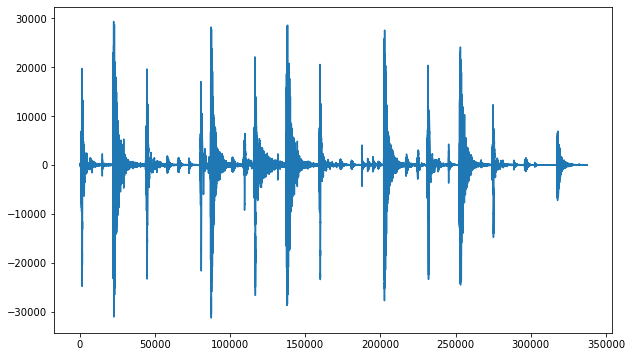

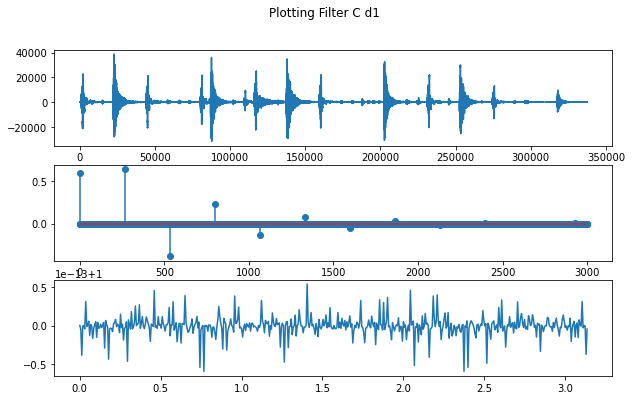

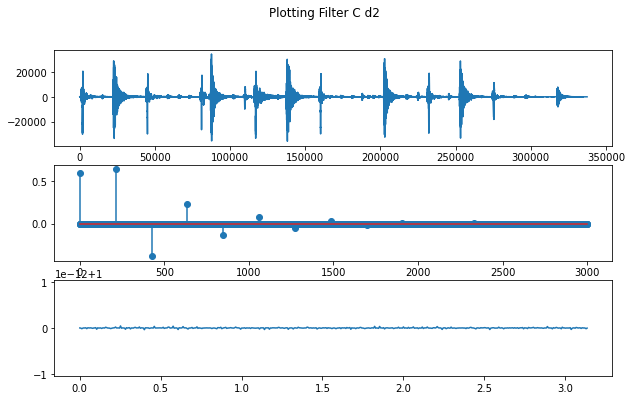

In [115]:
# YOUR CODE HERE
def allpassFilter(sound,rate, d1,d2):
    directDelay = d1/speedOfSound
    bounceDistance = 2 * (d1**2 + d2 **2) ** 0.05
    bounceDelay = bounceDistance/speedOfSound - directDelay
    N = int(bounceDelay*rate) #get N length
    x = sound   #populate with sound, no zeros
    a = [1] + [0] * (N-1) + [g]  # a = [1, 0 ,0 ... , g]  |b| = N
    b = [g] + [0] * (N-1) + [1] # b = [g, 0 ,0 ... , 1]  |b| = N
    return sg.lfilter(b, a, x), b, a, x

sound(file,rate, label='Drum loop')
resultsC1, bC1, aC1, xC1 = allpassFilter(file, rate, 0.1, 1)
sound(resultsB1,rate, label='delay C, 0.1 - 1')
resultsC2, bC2, aC2, xC2 = allpassFilter(file, rate, 1, 10)
sound(resultsB2,rate, label='delay C, 1 - 10')

print("In terms of audio differences between the two distances, we see that with a larger distance, we get more reverberation,\n"+
      "as the early reflections are more noticeable. It's also important to note that the sound is different because of \n"+
     "how the comb filter colors the sound, creating peaks, as seen in my graphs, where the frequency increases with a higher distance")

pp.plot(file)
pp.show()
plotFilter(resultsC1, bC1, aC1, xC1, "Plotting Filter C d1")
plotFilter(resultsC2, bC2, aC2, xC2, "Plotting Filter C d2")


# raise NotImplementedError()

## Part 2. Schroeder reverberators

Now we will combine multiple filters to make a more serious sounding reverb. Implement the structure shown below.

<img src="https://drive.google.com/uc?export=download&id=1ubIkl8Qn3osku39tym2ayxVk6KdC95ui" title="Reverb for part 2" width=600 >

Try to find the necessary parameters for the above structure that makes it sound as good as possible (not too busy, not too subtle). Hint: There is no right answer! Try a few things, see what sounds best and explain why you used the parameters you decided to use. As you come across some bad sounding cases, describe what the problem was.

In [116]:
# YOUR CODE HERE
# comb1,comb2,comb3,comb4,allpass1, allpass2
def Schroeder(x, rate, dry, comb1, comb2, comb3, comb4, allpass1, allpass2):
    #b1, a1, x1 kept the same because I don't need these values here, but I don't want to rewrite my code.
    result1, b1, a1, x1 = combFilter(x,rate, comb1[0],comb1[1])
    result2, b1, a1, x1 = combFilter(x,rate, comb2[0],comb2[1])
    result3, b1, a1, x1 = combFilter(x,rate, comb3[0],comb3[1])
    result4, b1, a1, x1 = combFilter(x,rate, comb4[0],comb4[1])
    combFilters = result1 /4 + result2 /4 + result3 /4 + result4 /4
    allPass, b1, a1, x1 = allpassFilter(combFilters,rate,allpass1[0],allpass1[1])
    allPass, b1, a1, x1 = allpassFilter(allPass,rate, allpass2[0],allpass2[1])
    allPass = np.array(allPass)+dry*np.array(allPass)
    return allPass


#do the combs, and add the comb values into the array
comb1 = [0.1, 1]
comb2 = [0.1, 2]
comb3 = [0.1, 3]
comb4 = [0.1, 4]
allpass1 = [1, 10]
allpass2 = [0.1, 1]
g = 0.8
schroder = Schroeder(file, rate, 1.2, comb1, comb2, comb3, comb4, allpass1, allpass2)
sound(schroder, rate, label="Schroeder")

print("For my first run, I simply used 1, 10 for my distances on everything, because I think this was my better \n"+
     "sounding distance originally. However, it sounded pretty bad when I put it through Schroeder. As I was modifying my \n"+
      "values, I found that keeping the same distance for each filter wouldn't help me get to a good sound very easily, if at\n"+
      "all. so instead, I started modifying the values for the allpass filters at the end, since intuitvely, they should have\n"+
      "the most impact once I found a 'sweetspot' for a filter (or just good enough), I would see if I could improve it more\n"+
      "by looking at another filter. Intuitvely the comb filters would have the same precedence, so my modifications for those\n"+
      "were mostly brute force")

Schroeder


For my first run, I simply used 1, 10 for my distances on everything, because I think this was my better 
sounding distance originally. However, it sounded pretty bad when I put it through Schroeder. As I was modifying my 
values, I found that keeping the same distance for each filter wouldn't help me get to a good sound very easily, if at
all. so instead, I started modifying the values for the allpass filters at the end, since intuitvely, they should have
the most impact once I found a 'sweetspot' for a filter (or just good enough), I would see if I could improve it more
by looking at another filter. Intuitvely the comb filters would have the same precedence, so my modifications for those
were mostly brute force


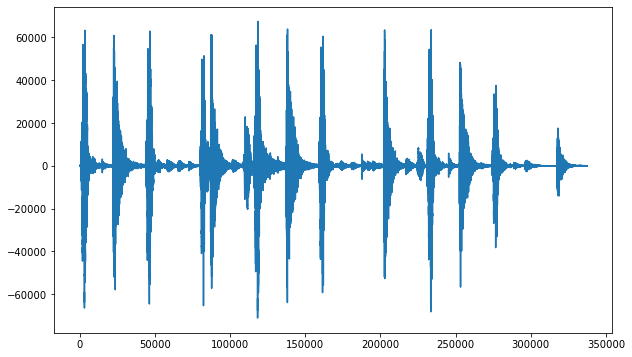

In [117]:
pp.plot(schroder)
pp.show()

## Part 3. Applying a real room response

To apply a more realistic filter we need to use a real room response. Download the St. Andrew’s church room impulse response (Stereo) from:

[ https://openairlib.net/?page_id=683 ]
    
Make sure that the sound you will convolve with it will be at the same sampling rate. This impulse response captures that church’s RIR using two channels. To synthesize a sound in that room you need to convolve it with the impulse response. If your test sound is a single-channel recording, you can simply convolve it with each of the two impulse responses and then use the resulting outputs as the left and right channel. You will notice that using the ```scipy.signal.lfilter``` command for this operation can take very long to compute. For faster convolutions we need to perform this filtering in the frequency domain (using the fast convolution algorithm that we mentioned in the filtering lecture). The function ```numpy.convolve``` automatically does that (if you use an up to date version), otherwise you can directly use ```scipy.signal.fftconvolve```.  Verify that the resulting output sounds like it has been placed inside a church.


original


""


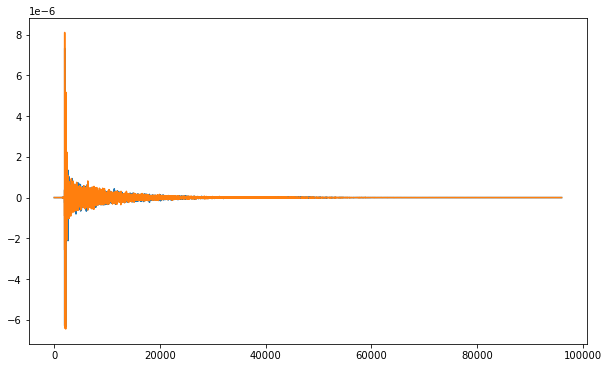

In [118]:
# YOUR CODE HERE
def sound( x, rate=8000, label=''):
    from IPython.display import display, Audio, HTML
    display( HTML( 
    '<style> table, th, td {border: 0px; }</style> <table><tr><td>' + label + 
    '</td><td>' + Audio( x, rate=rate)._repr_html_()[3:] + '</td></tr></table>'
    ))

rate, data = wavfile.read('./st-andrews-church/stereo/lyd3_000_ortf_48k.wav')
data = data.astype('float64')
data /= 2**16 - 1

print("original")
pp.plot(data)
data = data.T
convL = np.convolve(file,data[0])
convR = np.convolve(file,data[1])
sound([convL,convR],rate)

# raise NotImplementedError()

Convolve Left


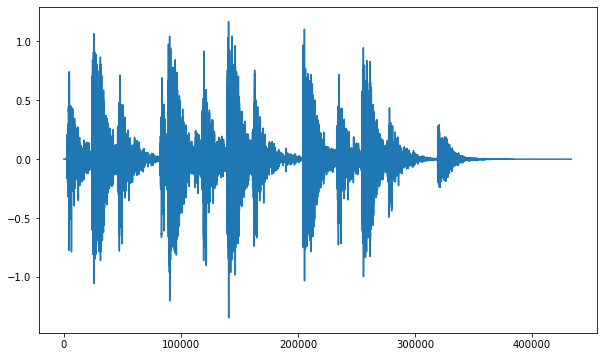

In [119]:
print("Convolve Left")
pp.plot(convL)

Convolve Right


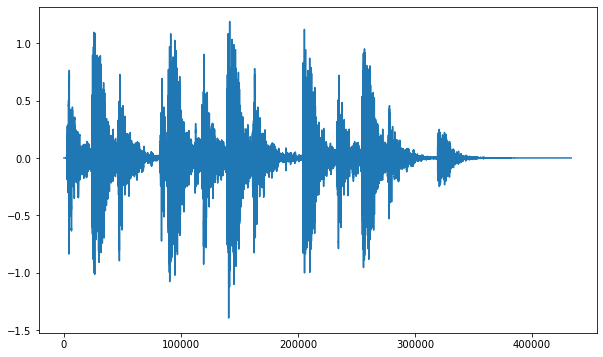

In [120]:
print("Convolve Right")
pp.plot(convR)

## Part 4 (extra credit). Measuring a room response.

Measuring a room response is crucial when trying to emulate a real room. In this exercise we will make a simple room response measurement. We will use the technique shown in the lecture slides.

a) Generate a chirp to use as our room excitation signal.

b) Go to a (preferably quiet) room that you want to measure, play the chirp from a speaker and record the outcome (the easiest way to do that is to save this sequence as a wave file and play it while you record a new sound file). You can instead use the real-time I/O code from Lab 0. In doing so you will obtain the sequence $y[t]$ from slide 36.

c) Now you will need to perform the actual deconvolution. Take $x[t]$ and $y[t]$, compute their DFTs to get $X[ω]$ and $Y[ω]$, and estimate $H[ω]$ (remember to zero pad the inputs since the output of the convolution will be about twice as long as the inputs). Take the inverse DFT of $H$ to get the time domain representation of the room impulse response. Does it look like one?

d) Convolve the resulting response with the test sound above (make sure you use the same sample rates). Does it sound reverberated? This won’t be perfect. What sounds “wrong” with it? Can you speculate why?

In [121]:
# YOUR CODE HERE

raise NotImplementedError()

NotImplementedError: 